# Example Notebook to Download and Mosaic GEE data at Scale

#### Main scripts:  
+ `download_gee_tiles.py`
+ `create_tile_mosaic.py`

Jordan Caraballo-Vega | NASA Goddard Space Flight Center  
Paul Montesano | NASA Goddard Space Flight Cetner | ADNET Systems, Inc  
July 2025

In [1]:
!pip install geedim

  Using cached geedim-2.0.0-py3-none-any.whl.metadata (6.0 kB)
  Using cached tabulate-0.9.0-py3-none-any.whl.metadata (34 kB)
  Using cached fsspec-2026.1.0-py3-none-any.whl.metadata (10 kB)
Using cached geedim-2.0.0-py3-none-any.whl (73 kB)
Using cached fsspec-2026.1.0-py3-none-any.whl (201 kB)
Using cached tabulate-0.9.0-py3-none-any.whl (35 kB)
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.10.0
    Uninstalling fsspec-2024.10.0:
      Successfully uninstalled fsspec-2024.10.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
s3fs 2024.10.0 requires fsspec==2024.10.0.*, but you have fsspec 2026.1.0 which is incompatible.
xcube 1.7.1 requires xarray<=2024.6,>=2022.6, but you have xarray 2024.10.0 which is incompatible.


## Import Libraries

In [2]:
import ee
import os
import geedim as gd
import geopandas as gpd
import rioxarray as rxr

from glob import glob
from pathlib import Path
from shapely.geometry import box, mapping

In [3]:
import sys
sys.path.append('/projects/code/icesat2_boreal/lib')
import plotlib
from mosaiclib import *
from pyproj import CRS


## Setup Credentials

First, get  GEE Service Account:  
https://developers.google.com/earth-engine/guides/service_account

In [4]:
gee_account = 'foreststructure@ee-paulmontesano.iam.gserviceaccount.com' # or just replace the auth with Authenticate
gee_key = '/projects/my-private-bucket/ee-paulmontesano-0f9993ea78eb.json'

In [5]:
# get credentials
credentials = ee.ServiceAccountCredentials(gee_account, gee_key)
ee.Initialize(credentials)  # gd initialize does not take service account
print("Initialized")

Initialized


## Get a set of tiles in 4326 and select with TTE extent

In [6]:
# our boreal tiling system in a custom albers projection
tte_envelope = gpd.read_file('/projects/my-public-bucket/databank/arc/wwf_terr_ecos_taiga-tundra.gpkg')
#boreal_domain_ = boreal_domain.copy()
#boreal_domain_['geometry'] = boreal_domain.to_crs(3857).geometry.buffer(1e5)

In [7]:
# the tiling system using for the copernicus dem is convenient for use with GEE, b/c its in 4326 (like GEE data)
tiles_index = gpd.read_file('/projects/my-public-bucket/databank/copernicus_dem30m_tiles.gpkg').cx[-180:180, 45:75]

In [14]:
tiles_index.shape

(7629, 4)

In [8]:
# using the boreal tiles to select the cop dem tiles that intersect it
tte_envelope['dissolve_field'] = 'for intersect'

# Do a dissolve so that there is only 1 polygon to intersect; .iloc[0]
tiles_index_tte = tiles_index[tiles_index.intersects(tte_envelope.to_crs(4326).dissolve(by='dissolve_field').iloc[0].geometry)]
#tiles_index_boreal.drop(columns=['id','key','s3'], inplace=True)

# Create a tile_num field for later use directly from the index
tiles_index_tte.reset_index(names='tile_num', inplace=True)
tiles_index_tte.to_file('/projects/my-public-bucket/databank/tte_tiles.gpkg', driver='GPKG')

In [15]:
tiles_index_tte.shape

(4809, 5)

In [9]:
tiles_index_tte.explore()

In [10]:
print(tiles_index_tte.crs.to_epsg())
tiles_index_tte.crs.to_wkt()

4326


'GEOGCRS["WGS 84",ENSEMBLE["World Geodetic System 1984 ensemble",MEMBER["World Geodetic System 1984 (Transit)"],MEMBER["World Geodetic System 1984 (G730)"],MEMBER["World Geodetic System 1984 (G873)"],MEMBER["World Geodetic System 1984 (G1150)"],MEMBER["World Geodetic System 1984 (G1674)"],MEMBER["World Geodetic System 1984 (G1762)"],MEMBER["World Geodetic System 1984 (G2139)"],MEMBER["World Geodetic System 1984 (G2296)"],ELLIPSOID["WGS 84",6378137,298.257223563,LENGTHUNIT["metre",1]],ENSEMBLEACCURACY[2.0]],PRIMEM["Greenwich",0,ANGLEUNIT["degree",0.0174532925199433]],CS[ellipsoidal,2],AXIS["geodetic latitude (Lat)",north,ORDER[1],ANGLEUNIT["degree",0.0174532925199433]],AXIS["geodetic longitude (Lon)",east,ORDER[2],ANGLEUNIT["degree",0.0174532925199433]],USAGE[SCOPE["Horizontal component of 3D system."],AREA["World."],BBOX[-90,-180,90,180]],ID["EPSG",4326]]'

In [11]:
tiles_index_crs_proj4 = CRS.from_wkt(tiles_index_tte.crs.to_wkt()).to_proj4()
tiles_index_crs_proj4

/opt/conda/envs/pangeo/lib/python3.12/site-packages/pyproj/crs/crs.py:1295: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)


'+proj=longlat +datum=WGS84 +no_defs +type=crs'

In [12]:
tiles_index_crs_epsg = CRS.from_wkt(tiles_index_tte.crs.to_wkt()).to_epsg()
tiles_index_crs_epsg # <--- doesnt work for custom albers

4326

### Select a `tile_num` to see the area for GEE extraction

In [16]:
tiles_index_tte.shape

(4809, 5)

#### Tiles for NW territories

In [21]:
TILES_LIST_NW_TERR = list(range(409,427+1)) + list(range(4817,4857+1)) + list(range(4521,4565+1)) + list(range(4217,4263+1)) +\
                        list(range(3903,3954+1)) + list(range(3581,3635+1))+\
                        list(range(3261,3322+1)) + list(range(2955,3017+1))+\
                        list(range(2663,2725+1)) + list(range(2389,2449+1))+list(range(2117,2175+1))+\
                        list(range(7217,7273+1)) + list(range(6980,7028+1))+list(range(2117,2175+1))+list(range(6752,6800+1))+list(range(6529,6577+1))

len(TILES_LIST_NW_TERR)

830

#### Tiles for western Alaska

In [40]:
import geopandas as gpd
from shapely.geometry import box

# Define bbox in lat/lon (xmin, ymin, xmax, ymax)
bbox = box(-169, 40, -154, 75)

# Create GeoDataFrame from bbox in WGS84
bbox_gdf = gpd.GeoDataFrame({'geometry': [bbox]}, crs='EPSG:4326')

# Transform bbox to match your tiles CRS
bbox_gdf = bbox_gdf.to_crs(tiles_index_tte.crs)

# Select tiles that intersect the bbox
tiles_subset_westernAK = tiles_index_tte[tiles_index_tte.intersects(bbox_gdf.geometry.iloc[0])]

print(f"Selected {len(tiles_subset_westernAK)} tiles for western Alaska")


Selected 210 tiles for western Alaska


In [36]:
FOCAL_TILE = 4222 #3264 #3583 #3263

tiles_index_tte_FOCAL = tiles_index_tte[tiles_index_tte.tile_num.isin([FOCAL_TILE])]
tiles_index_TTE_TILES_LIST = tiles_index_tte[tiles_index_tte.tile_num.isin(tiles_subset_westernAK.tile_num.to_list())]
tiles_index_tte_FOCAL.explore(color='#fdb863', 
                                 m=tiles_index_TTE_TILES_LIST.explore(color='red', 
                                     m=tiles_index_tte.explore(color='#d8daeb'
                                                                 )
                                                                        )
                                )

In [37]:
# FOCAL_TILE = 4222 #3264 #3583 #3263

# tiles_index_boreal_FOCAL = tiles_index_boreal[tiles_index_tte.tile_num.isin([FOCAL_TILE])]
# tiles_index_boreal_TILES_LIST = tiles_index_boreal[tiles_index_boreal.tile_num.isin(TILES_LIST_NW_TERR)]
# tiles_index_boreal_FOCAL.explore(color='#fdb863', 
#                                  m=tiles_index_boreal_TILES_LIST.explore(color='red', 
#                                      m=tiles_index_boreal.explore(color='#d8daeb', 
#                                         m=boreal_tiles.explore(color='#542788')
#                                                                  )
#                                                                         )
#                                 )

In [38]:
# tile_geom_4326 = tiles_index_boreal_FOCAL.to_crs(4326).geometry.iloc[0]
# tile_geom_4326

In [55]:
#geom = boreal_tiles[boreal_tiles.tile_num.isin([FOCAL_TILE])].geometry
ASSET_TYPE = 'alphaearth'
ASSET_PATH = 'GOOGLE/SATELLITE_EMBEDDING/V1/ANNUAL'
ee_geom = ee.Geometry(mapping(tile_geom_4326))
year = 2023 # year to download
scale = 30 # resolution
nodata = -9999

In [53]:
#geom = boreal_tiles[boreal_tiles.tile_num.isin([FOCAL_TILE])].geometry
ASSET_TYPE = 'TTEmap_3000'
ASSET_PATH = 'projects/foreststructure/TTE_DATA_v201902v2' # f'https://code.earthengine.google.com/?asset={ASSET_PATH}'
FOCAL_TILE_LIST = tiles_subset_westernAK.tile_num.to_list() #TILES_LIST_NW_TERR
#ee_geom = ee.Geometry(mapping(tile_geom_4326))
year = 2010 # year to download
scale = 3000 # resolution
nodata = -9999

In [61]:
ASSET_TYPE = 'MERIT_DEM_3000'
ASSET_PATH = "MERIT/DEM/v1_0_3"
FOCAL_TILE_LIST = TILES_LIST_NW_TERR
year = 'all'
scale = 3000 # resolution
nodata = -9999

In [42]:
DO_DOWNLOAD = True

In [43]:
OUTDIR = f'/projects/my-public-bucket/local_output/{ASSET_TYPE}'
!mkdir -p $OUTDIR

In [56]:
if DO_DOWNLOAD:
    for FOCAL_TILE in FOCAL_TILE_LIST:
        output_filename = f'{OUTDIR}/{ASSET_TYPE}_{year}_{scale}m_copdemtiles{FOCAL_TILE:07}.tif'
        
        # Check if file already exists
        if os.path.exists(output_filename):
            print(f"Skipping tile {FOCAL_TILE} - file already exists: {output_filename}")
            continue
        
        print(f"Processing tile {FOCAL_TILE}...")
        tiles_index_tte_FOCAL = tiles_index_tte[tiles_index_tte.tile_num.isin([FOCAL_TILE])]
        tile_geom_4326 = tiles_index_tte_FOCAL.to_crs(4326).geometry.iloc[0]
        ee_geom = ee.Geometry(mapping(tile_geom_4326))
        
        # Check what type of asset it is
        try:
            asset_info = ee.data.getAsset(ASSET_PATH)
            asset_type = asset_info['type']
            
            if asset_type == 'IMAGE_COLLECTION':
                gee_image_collection = ee.ImageCollection(ASSET_PATH) \
                    .filterBounds(ee_geom) \
                    .filterDate(f'{year}-01-01', f'{year+1}-01-01')
                gee_image = gee_image_collection.toBands().clip(ee_geom)
            elif asset_type == 'IMAGE':
                gee_image = ee.Image(ASSET_PATH).clip(ee_geom)
            else:
                raise ValueError(f"Unsupported asset type: {asset_type}")
                
        except Exception as e:
            print(f"Error accessing asset for tile {FOCAL_TILE}: {e}")
            continue  # Skip to next tile on error
        
        try:
            # Start download
            print(f"Downloading tile {FOCAL_TILE} to {output_filename}")
            im = gd.mask.MaskedImage(gee_image)
            im.download(output_filename, region=ee_geom, 
                      crs=f'EPSG:4326', 
                      scale=scale,
                      resampling='near'  # Nearest neighbor for classified data
                     )
            
            # Verify download worked
            if os.path.exists(output_filename):
                print(f"Successfully downloaded tile {FOCAL_TILE}")
                
                # Optional: Build overviews with nearest neighbor
                try:
                    subprocess.run([
                        'gdaladdo', '-r', 'nearest', output_filename, 
                        '2', '4', '8', '16', '32'
                    ], check=True)
                    print(f"Built overviews for tile {FOCAL_TILE}")
                except Exception as e:
                    print(f"Warning: Failed to build overviews for tile {FOCAL_TILE}: {e}")
            else:
                print(f"Warning: Download appeared to succeed but file not found: {output_filename}")
                
        except Exception as e:
            print(f"Error downloading tile {FOCAL_TILE}: {e}")
            # If partial download exists, remove it
            if os.path.exists(output_filename):
                try:
                    os.remove(output_filename)
                    print(f"Removed partial download of tile {FOCAL_TILE}")
                except:
                    print(f"Warning: Could not remove partial download of tile {FOCAL_TILE}")

Processing tile 399...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/image.py:254: RuntimeWarning: Couldn't find STAC entry for: 'projects/foreststructure/TTE_DATA_v201902v2'.
  return STACClient().get(self.id)
/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


Successfully downloaded tile 399
Processing tile 400...


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 400
Processing tile 401...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 401
Processing tile 402...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 402
Processing tile 403...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 403
Processing tile 404...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 404
Processing tile 405...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 405
Processing tile 406...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 406
Processing tile 407...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 407
Processing tile 408...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 408
Processing tile 652...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 652
Processing tile 653...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 653
Processing tile 654...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 654
Processing tile 655...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 655
Processing tile 2102...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2102
Processing tile 2103...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2103
Processing tile 2104...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2104
Processing tile 2105...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2105
Processing tile 2106...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2106
Processing tile 2107...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2107
Processing tile 2108...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2108
Processing tile 2109...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2109
Processing tile 2110...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2110
Processing tile 2111...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2111
Processing tile 2112...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2112
Processing tile 2113...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2113
Processing tile 2114...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2114
Processing tile 2115...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2115
Processing tile 2116...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2116
Processing tile 2375...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2375
Processing tile 2376...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2376
Processing tile 2377...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2377
Processing tile 2378...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2378
Processing tile 2379...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2379
Processing tile 2380...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2380
Processing tile 2381...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2381
Processing tile 2382...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2382
Processing tile 2383...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2383
Processing tile 2384...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2384
Processing tile 2385...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2385
Processing tile 2386...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2386
Processing tile 2387...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2387
Processing tile 2388...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2388
Processing tile 2650...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2650
Processing tile 2651...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2651
Processing tile 2652...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2652
Processing tile 2653...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2653
Processing tile 2654...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2654
Processing tile 2655...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2655
Processing tile 2656...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2656
Processing tile 2657...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2657
Processing tile 2658...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2658
Processing tile 2659...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2659
Processing tile 2660...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2660
Processing tile 2661...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2661
Processing tile 2662...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2662
Processing tile 2941...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2941
Processing tile 2943...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2943
Processing tile 2944...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2944
Processing tile 2945...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2945
Processing tile 2946...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2946
Processing tile 2947...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2947
Processing tile 2948...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2948
Processing tile 2949...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2949
Processing tile 2950...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2950
Processing tile 2951...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2951
Processing tile 2952...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2952
Processing tile 2953...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2953
Processing tile 2954...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 2954
Processing tile 3245...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3245
Processing tile 3247...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3247
Processing tile 3248...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3248
Processing tile 3249...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3249
Processing tile 3250...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3250
Processing tile 3251...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3251
Processing tile 3252...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3252
Processing tile 3253...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3253
Processing tile 3254...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3254
Processing tile 3255...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3255
Processing tile 3256...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3256
Processing tile 3257...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3257
Processing tile 3258...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3258
Processing tile 3259...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3259
Processing tile 3260...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3260
Processing tile 3565...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3565
Processing tile 3566...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3566
Processing tile 3567...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3567
Processing tile 3568...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3568
Processing tile 3569...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3569
Processing tile 3570...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3570
Processing tile 3571...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3571
Processing tile 3572...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3572
Processing tile 3573...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3573
Processing tile 3574...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3574
Processing tile 3575...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3575
Processing tile 3576...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3576
Processing tile 3577...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3577
Processing tile 3578...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3578
Processing tile 3579...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3579
Processing tile 3580...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3580
Processing tile 3889...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3889
Processing tile 3890...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3890
Processing tile 3891...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3891
Processing tile 3892...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3892
Processing tile 3893...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3893
Processing tile 3894...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3894
Processing tile 3895...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3895
Processing tile 3896...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3896
Processing tile 3897...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3897
Processing tile 3898...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3898
Processing tile 3899...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3899
Processing tile 3900...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3900
Processing tile 3901...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3901
Processing tile 3902...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 3902
Processing tile 4204...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4204
Processing tile 4205...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4205
Processing tile 4206...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4206
Processing tile 4207...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4207
Processing tile 4208...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4208
Processing tile 4209...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4209
Processing tile 4210...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4210
Processing tile 4211...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4211
Processing tile 4212...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4212
Processing tile 4213...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4213
Processing tile 4214...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4214
Processing tile 4215...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4215
Processing tile 4216...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4216
Processing tile 4507...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4507
Processing tile 4508...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4508
Processing tile 4509...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4509
Processing tile 4510...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4510
Processing tile 4511...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4511
Processing tile 4512...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4512
Processing tile 4513...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4513
Processing tile 4514...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4514
Processing tile 4515...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4515
Processing tile 4516...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4516
Processing tile 4517...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4517
Processing tile 4518...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4518
Processing tile 4519...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4519
Processing tile 4520...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4520
Processing tile 4806...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4806
Processing tile 4807...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4807
Processing tile 4808...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4808
Processing tile 4809...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4809
Processing tile 4810...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4810
Processing tile 4811...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4811
Processing tile 4812...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4812
Processing tile 4813...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4813
Processing tile 4814...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4814
Processing tile 4815...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4815
Processing tile 4816...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 4816
Processing tile 5564...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 5564
Processing tile 5807...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 5807
Processing tile 5808...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 5808
Processing tile 5809...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 5809
Processing tile 6048...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6048
Processing tile 6049...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6049
Processing tile 6050...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6050
Processing tile 6051...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6051
Processing tile 6052...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6052
Processing tile 6053...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6053
Processing tile 6054...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6054
Processing tile 6055...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6055
Processing tile 6291...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6291
Processing tile 6292...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6292
Processing tile 6293...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6293
Processing tile 6294...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6294
Processing tile 6295...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6295
Processing tile 6296...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6296
Processing tile 6298...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6298
Processing tile 6521...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6521
Processing tile 6522...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6522
Processing tile 6523...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6523
Processing tile 6524...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6524
Processing tile 6525...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6525
Processing tile 6526...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6526
Processing tile 6527...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6527
Processing tile 6528...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6528
Processing tile 6746...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6746
Processing tile 6747...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6747
Processing tile 6748...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6748
Processing tile 6749...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6749
Processing tile 6750...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6750
Processing tile 6751...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6751
Processing tile 6970...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6970
Processing tile 6971...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6971
Processing tile 6972...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6972
Processing tile 6973...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6973
Processing tile 6974...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6974
Processing tile 6975...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6975
Processing tile 6976...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6976
Processing tile 6977...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6977
Processing tile 6978...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6978
Processing tile 6979...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 6979
Processing tile 7202...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 7202
Processing tile 7203...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 7203
Processing tile 7204...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 7204
Processing tile 7205...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 7205
Processing tile 7206...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 7206
Processing tile 7207...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 7207
Processing tile 7208...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 7208
Processing tile 7209...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 7209
Processing tile 7210...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 7210
Processing tile 7211...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 7211
Processing tile 7212...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 7212
Processing tile 7213...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 7213
Processing tile 7214...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 7214
Processing tile 7215...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 7215
Processing tile 7216...


/opt/conda/envs/pangeo/lib/python3.12/site-packages/geedim/mask.py:579: FutureWarning: 'MaskedImage' is deprecated and will be removed in a future release.  Please use the 'ee.Image.gd' accessor instead.
  super().__init__(ee_image)


...ts/foreststructure/TTE_DATA_v201902v2:   0%|          |0/1 tiles [00:00<?]

Successfully downloaded tile 7216


## Build script for DPS deployment

#### Projection situation with downloading data from GEE
1. NATIVE GEE prj: on GEE my TTE data says its in a Lambert Equal Area projection (evident when observing the pixels in GEE: https://code.earthengine.google.com/ed4059388ee52fad93eff6ba6ddafc5c)
2. when i download:
   + geedim seems to not be able to get this NATIVE prpjection, so defaults to downloading in 4326 - the means pixels are resampled (nearest) and this changes the data slightly (not good).
   + i use a 4326 tiles vector so that the pixels of each image neatly fit in the vector and there is no overlap with adjacent tiles' pixels (good)
3. would be nice to:
   + get this NATIVE projection correctly and download (so no resampling)
   + use a tiles vector in this native projection so pixels fit neatly
   + there seems to be an issue generating a tiles vector from scratch in an equal area prj for the full north that is slit at the datelines : `code/maap_tools/notebooks/tiles_grid_chatbot_attempt.ipynb`
4. Finally - you want only band 4 and you want a COG - so incorporate `subset_bands_to_cog.py`

In [41]:
#geom = boreal_tiles[boreal_tiles.tile_num.isin([FOCAL_TILE])].geometry
ASSET_TYPE = 'TTEmap'
ASSET_PATH = 'projects/foreststructure/TTE_DATA_v201902v2' # f'https://code.earthengine.google.com/?asset={ASSET_PATH}'
FOCAL_TILE_LIST = [3930] #TILES_LIST_NW_TERR
#ee_geom = ee.Geometry(mapping(tile_geom_4326))
year = 2010 # year to download
scale = 30 # resolution
nodata = -9999

In [42]:
cmd = f"/opt/conda/envs/pangeo/bin/python /projects/code/maap_tools/lib/download_gee_tiles.py -h"
!eval $cmd

usage: download_gee_tiles.py [-h] --gee_account GEE_ACCOUNT --gee_key_path
                             GEE_KEY_PATH --asset_path ASSET_PATH --asset_type
                             ASSET_TYPE --year YEAR --scale SCALE --outdir
                             OUTDIR --tiles_csv TILES_CSV
                             [--tile_list TILE_LIST]
                             [--resampling {near,bilinear,cubic,average}]
                             [--crs CRS]

Download GEE assets by tile

options:
  -h, --help            show this help message and exit
  --gee_account GEE_ACCOUNT
                        GEE service account email (e.g., "my-service-
                        account@my-project.iam.gserviceaccount.com")
  --gee_key_path GEE_KEY_PATH
                        Path to GEE service account JSON key file (local path
                        or s3://bucket/path/to/key.json)
  --asset_path ASSET_PATH
                        Path to GEE asset (e.g., "users/username/asset")
  --asset_type ASSE

In [81]:
boreal_tiles = gpd.read_file('/projects/my-public-bucket/databank/boreal_tiles_v004_model_ready.gpkg')
boreal_tiles.crs.to_string()

'PROJCS["unnamed",GEOGCS["GRS 1980(IUGG, 1980)",DATUM["unknown",SPHEROID["GRS80",6378137,298.257222101],TOWGS84[0,0,0,0,0,0,0]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433]],PROJECTION["Albers_Conic_Equal_Area"],PARAMETER["standard_parallel_1",50],PARAMETER["standard_parallel_2",70],PARAMETER["latitude_of_center",40],PARAMETER["longitude_of_center",180],PARAMETER["false_easting",0],PARAMETER["false_northing",0],UNIT["Meter",1],AXIS["Easting",EAST],AXIS["Northing",NORTH]]'

In [88]:
cmd = f'''/opt/conda/envs/pangeo/bin/python /projects/code/maap_tools/lib/download_gee_tiles.py \
    --gee_account {'foreststructure@ee-paulmontesano.iam.gserviceaccount.com'} \
    --gee_key {'s3://maap-ops-workspace/montesano/ee-paulmontesano-0f9993ea78eb.json'} \
    --asset_path {ASSET_PATH} \
    --asset_type {ASSET_TYPE} \
    --year {year} \
    --scale {scale} \
    --outdir {'/projects/my-public-bucket/local_output/TTEmap'} \
    --tiles_csv {'/projects/my-public-bucket/databank/tte_tiles.gpkg'} \
    --tile_list {'3929'} \
    --resampling  near \
    --crs NATIVE\
'''
!eval $cmd

Initializing Google Earth Engine...
Bucket: maap-ops-workspace
Key: montesano/ee-paulmontesano-0f9993ea78eb.json
Successfully downloaded GEE key to temporary file: /tmp/tmpt3z47dx4.json
Successfully loaded GEE service account key
Earth Engine initialized successfully with service account: foreststructure@ee-paulmontesano.iam.gserviceaccount.com
Loaded 4809 tiles from /projects/my-public-bucket/databank/tte_tiles.gpkg
Filtered to 1 tiles based on tile_list
Using specified CRS: NATIVE
Processing 1 tiles...
Asset path: projects/foreststructure/TTE_DATA_v201902v2
Download CRS: NATIVE
Resampling: near
Processing tile 3929...
Detecting native CRS for tile 3929...
ee.Projection({
  "functionInvocationValue": {
    "functionName": "Image.projection",
    "arguments": {
      "image": {
        "functionInvocationValue": {
          "functionName": "Image.load",
          "arguments": {
            "id": {
              "constantValue": "projects/foreststructure/TTE_DATA_v201902v2"
            

## Subset bands to COG - after build_tindex

In [29]:
FOCAL_TILE = 3931
tte_tindex = gpd.read_file('s3://maap-ops-workspace/shared/montesano/DPS_tile_lists/TTE/download_gee_tiles_v1/tte_montesano_2010_30m/TTE_tindex_master.gpkg')
FN = tte_tindex[tte_tindex.tile_num == FOCAL_TILE].local_path.to_list()[0]
FN

'/projects/my-private-bucket/dps_output/run_download_gee_tiles/download_gee_tiles_v1/tte_montesano_2010_30m/2025/11/14/16/23/50/168407/tte_montesano_2010_30m_0003931.tif'

In [31]:
import subprocess

OUT_CRS = "+proj=aea +lat_1=50 +lat_2=70 +lat_0=60 +lon_0=-96 +x_0=0 +y_0=0 +datum=WGS84 +units=m +no_defs"

cmd = [
    "/opt/conda/envs/pangeo/bin/python", 
    "/projects/code/maap_tools/lib/subset_bands_to_cog.py",
    "--input_file", FN,
    "--bands", "4",
    "--output_dir", "/projects/my-public-bucket/local_output/TTEmap",
    #"--target_crs", OUT_CRS,
    #"--resolution", "30", "30",
    "--output_nodata", "0",
    "--band_names", "classification",
    "--output_prefix", "tte_class",
    "--verbose"
]

# Run the command
result = subprocess.run(cmd, capture_output=True, text=True)
print("STDOUT:", result.stdout)
print("STDERR:", result.stderr)
print("Return code:", result.returncode)

STDOUT: === Band Subset to COG Processor ===
Input: Single file - /projects/my-private-bucket/dps_output/run_download_gee_tiles/download_gee_tiles_v1/tte_montesano_2010_30m/2025/11/14/16/23/50/168407/tte_montesano_2010_30m_0003931.tif
Bands to extract: [4]
Output directory: /projects/my-public-bucket/local_output/TTEmap
Band names: ['classification']
Output nodata value: 0.0

Processing single file...
Processing: /projects/my-private-bucket/dps_output/run_download_gee_tiles/download_gee_tiles_v1/tte_montesano_2010_30m/2025/11/14/16/23/50/168407/tte_montesano_2010_30m_0003931.tif
  Bands: [4]
  Output: /projects/my-public-bucket/local_output/TTEmap/tte_class_tte_montesano_2010_30m_0003931_bands4.tif
  Input shape: (1, 3714, 3712)
  Input CRS: EPSG:4326
  Input nodata: -inf
  Output nodata: 0.0
Shape of input:			 (1, 3714, 3712)
Resampling:			 0	[0=nearest, 1=blinear, 2=cubic]
Output resolution:		 None
Writing img to memory...
Current stack shape:		(1,3712,3714)
Image written to disk:		 

## Create tile mosaics (eg, coarsened)

#### test functions

In [59]:
import glob
import subprocess
import os
from pathlib import Path

def create_tile_mosaic(tile_directory, output_file, band=4, resample='nearest'):
    """
    Create a mosaic from forest structure classification tiles using a specific band
    """

    if os.path.isdir(tile_directory):
        # Change to tile directory
        os.chdir(tile_directory)
        
        # Find all tile files
        tile_files = glob.glob("*.tif")
    else:
        pass
    
    if not tile_files:
        print("No .tif files found in directory!")
        return
    
    print(f"Creating mosaic from {len(tile_files)} tiles using band {band}...")
    
    # Step 1: Create VRT with specific band
    vrt_file = "temp_mosaic.vrt"
    cmd_vrt = [
        'gdalbuildvrt',
        '-b', str(band),  # Select specific band
        '-srcnodata', '0',
        '-vrtnodata', '0',
        vrt_file
    ] + tile_files
    
    subprocess.run(cmd_vrt, check=True)
    
    # Step 2: Convert to final mosaic
    cmd_warp = [
        'gdalwarp',
        '-r', 'near',  # Nearest neighbor for classified data
        '-co', 'COMPRESS=LZW',
        '-co', 'TILED=YES',
        '-co', 'BIGTIFF=YES',
        '-co', 'NUM_THREADS=ALL_CPUS',
        vrt_file,
        output_file
    ]
    
    subprocess.run(cmd_warp, check=True)
    
    # Step 3: Build overviews with nearest neighbor
    cmd_ovr = [
        'gdaladdo',
        '-r', resample,
        output_file,
        '2', '4', '8', '16', '32', '64'
    ]
    
    subprocess.run(cmd_ovr, check=True)
    
    # Cleanup
    os.remove(vrt_file)
    
    print(f"Mosaic completed: {output_file}")
    print(f"Band {band} extracted and mosaicked successfully")

In [60]:
%%time
create_tile_mosaic('/projects/my-public-bucket/local_output/TTEmap_3000', 'TTEmap_3000_classification_mosaic.tif', band=4, resample='nearest')

Creating mosaic from 981 tiles using band 4...
Creating output file that is 3044P x 743L.
Using internal nodata values (e.g. 0) for image temp_mosaic.vrt.
Copying nodata values from source temp_mosaic.vrt to destination TTEmap_3000_classification_mosaic.tif.
Processing temp_mosaic.vrt [1/1] : 0...10...20...30...40...50...60...70...80...90...100 - done.
0...10...20...30...40...50...60...70...80...90...100 - done.
Mosaic completed: TTEmap_3000_classification_mosaic.tif
Band 4 extracted and mosaicked successfully
CPU times: user 12.8 ms, sys: 3.99 ms, total: 16.8 ms
Wall time: 2min 34s


In [68]:
%%time
create_tile_mosaic('/projects/my-public-bucket/local_output/MERIT_DEM_3000', 'MERIT_DEM_3000_mosaic.tif', band=1, resample='bilinear')

Creating mosaic from 771 tiles using band 1...
0...10...20...30...40...50...60...70...80...90...100 - done.
Creating output file that is 2450P x 558L.
Using internal nodata values (e.g. 0) for image temp_mosaic.vrt.
Copying nodata values from source temp_mosaic.vrt to destination MERIT_DEM_3000_mosaic.tif.
Processing temp_mosaic.vrt [1/1] : 0...10...20...30...40...50...60...70...80...90...100 - done.
0...10...20...30...40...50...60...70...80...90...100 - done.
Mosaic completed: MERIT_DEM_3000_mosaic.tif
Band 1 extracted and mosaicked successfully


### Command line script

In [105]:
cmd ='/opt/conda/envs/pangeo/bin/python /projects/code/maap_tools/lib/create_tile_mosaic.py '
!eval $cmd -h

usage: create_tile_mosaic.py [-h] --tile_index_csv TILE_INDEX_CSV
                             --output_path OUTPUT_PATH [-o OUTPUT_PATH]
                             [--band BAND]
                             [--output_dtype {byte,uint8,int8,uint16,int16,uint32,int32,float32,float64}]
                             [--tile_column TILE_COLUMN]
                             [--path_column PATH_COLUMN]
                             [--tile_list TILE_LIST] [--target_crs TARGET_CRS]
                             [--target_resolution TARGET_RESOLUTION]
                             [--resampling_method {nearest,bilinear,cubic,average,mode}]
                             [--compress {LZW,DEFLATE,ZSTD,JPEG,WEBP,NONE}]
                             [--tiled] [--no_tiled] [--blocksize BLOCKSIZE]
                             [--nodata_value NODATA_VALUE] [--enable_s3]
                             [--base_name BASE_NAME] [--verbose]

Create a raster mosaic from tiles listed in a CSV index file

options:


In [ ]:
#### Create a mosaic of band 4 (tte classification)

In [132]:
args = f"\
--tile_index_csv /projects/my-public-bucket/DPS_tile_lists/TTE/download_gee_tiles_v1/tte_montesano_2010_30m/TTE_tindex_master.csv \
--output_path /projects/my-public-bucket/DPS_tile_lists/TTE/download_gee_tiles_v1/tte_montesano_2010_30m \
--base_name tte_classification \
--path_column s3_path \
--tile_list all \
--nodata_value 0 \
--target_resolution 0.01 \
--band 4 --output_dtype uint8 --resampling_method nearest\
"
# 3570,3571,3572,3250,3251,3252
args += ' --enable_s3'
#args += ' --target_crs EPSG:4326'
!echo $cmd $args

/opt/conda/envs/pangeo/bin/python /projects/code/maap_tools/lib/create_tile_mosaic.py --tile_index_csv /projects/my-public-bucket/DPS_tile_lists/TTE/download_gee_tiles_v1/tte_montesano_2010_30m/TTE_tindex_master.csv --output_path /projects/my-public-bucket/DPS_tile_lists/TTE/download_gee_tiles_v1/tte_montesano_2010_30m --base_name tte_classification --path_column s3_path --tile_list all --nodata_value 0 --target_resolution 0.01 --band 4 --output_dtype uint8 --resampling_method nearest --enable_s3


In [133]:
%%time
!eval $cmd $args

Mosaic Configuration:
  Input CSV: /projects/my-public-bucket/DPS_tile_lists/TTE/download_gee_tiles_v1/tte_montesano_2010_30m/TTE_tindex_master.csv
  Output path: /projects/my-public-bucket/DPS_tile_lists/TTE/download_gee_tiles_v1/tte_montesano_2010_30m
  Tile column: tile_num
  Path column: s3_path
  Band: 4
  Output data type: uint8
  Tile list: All tiles
  Target CRS: Auto (from first tile)
  Target resolution: 0.01
  Resampling: nearest
  Compression: LZW
  Tiled: True
  Block size: 512x512
  S3 support: True

S3 filesystem initialized with anonymous access
Reading tile index from: /projects/my-public-bucket/DPS_tile_lists/TTE/download_gee_tiles_v1/tte_montesano_2010_30m/TTE_tindex_master.csv
Processing 4809 tiles
Found 4809 valid raster files
Using nodata value: 0.0 (compatible with uint8)
Extracting band 4 and converting to uint8...
Opened 4809 datasets for mosaicking
Using CRS from reference dataset: EPSG:4326
Output file: /projects/my-public-bucket/DPS_tile_lists/TTE/download_g

In [145]:
# you can also download it as numpy arrays, xarray, etc.; for more information reference
# https://geedim.readthedocs.io/en/stable/getting_started/api.html#numpy

In [64]:
import rasterio
from rasterio.plot import show_hist, show
import numpy as np
import matplotlib.pyplot as plt

In [65]:
#output_filename = '/projects/my-public-bucket/local_output/alphaearth/alphaearth_2023_30m_copdemtiles0003263.tif'

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': -inf, 'width': 3711, 'height': 3714, 'count': 3, 'crs': CRS.from_epsg(4326), 'transform': Affine(0.00026949458523585647, 0.0, -152.00033596472775,
       0.0, -0.00026949458523585647, 65.00101598054763), 'blockysize': 1, 'tiled': False, 'interleave': 'pixel'}


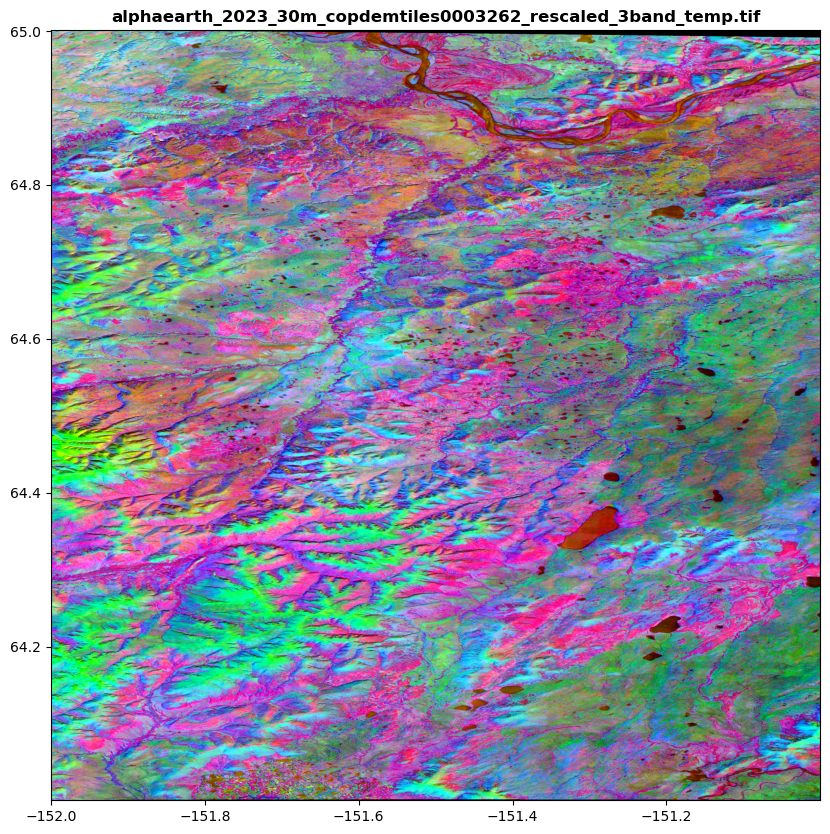

In [66]:
fn = output_filename

rescaled_multiband_fn = fn.replace('.tif', '_rescaled_3band_temp.tif')

plotlib.rescale_multiband_for_plot(fn, rescaled_multiband_fn, bandlist = [1,2,3], pct=[2,98], nodata=-9999.0) 

fig,ax=plt.subplots(figsize=(10,10))

with rasterio.open(rescaled_multiband_fn) as src:
    print(src.profile)
    show(src.read([1,2,3]),transform=src.transform, ax=ax, title=os.path.basename(rescaled_multiband_fn))